In [1]:
import sys
sys.path.append('..')
import pathlib
import numpy as np
from skimage.color import rgb2gray
from skimage.transform import resize, rescale
from skimage.exposure import adjust_gamma, equalize_hist
from skimage.filters import gaussian, laplace

from utils import transform_and_store, plot_transformation_comparison


In [2]:
main_path='../dados/Hypercellularity/'

# Aplicando resize nas imagens

In [4]:
def apply_resizing(input_image):
    return resize(image=input_image, output_shape=(700,700)) 

transform_and_store(
    main_path=main_path,
    data_folder_name='00-original', 
    new_folder_name='01-resized', 
    transformation_function=apply_resizing
    )

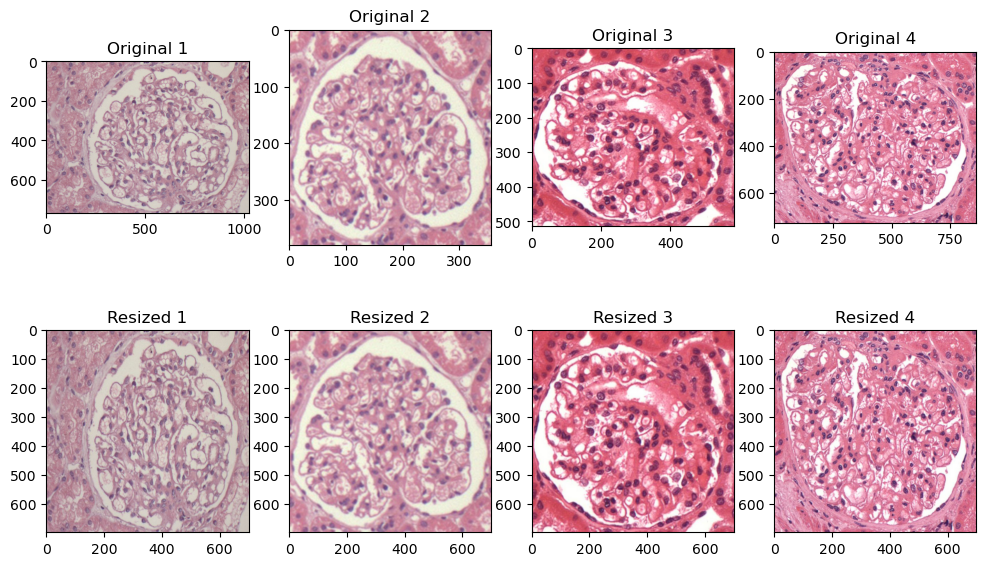

In [5]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='00-original', 
    new_folder_name='01-resized',
    )

# Transformando imagens em gray scale 

In [6]:
def apply_gray_transformation(input_image):
    return rgb2gray(input_image)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='02-grayScaled', 
    transformation_function=apply_gray_transformation
    )

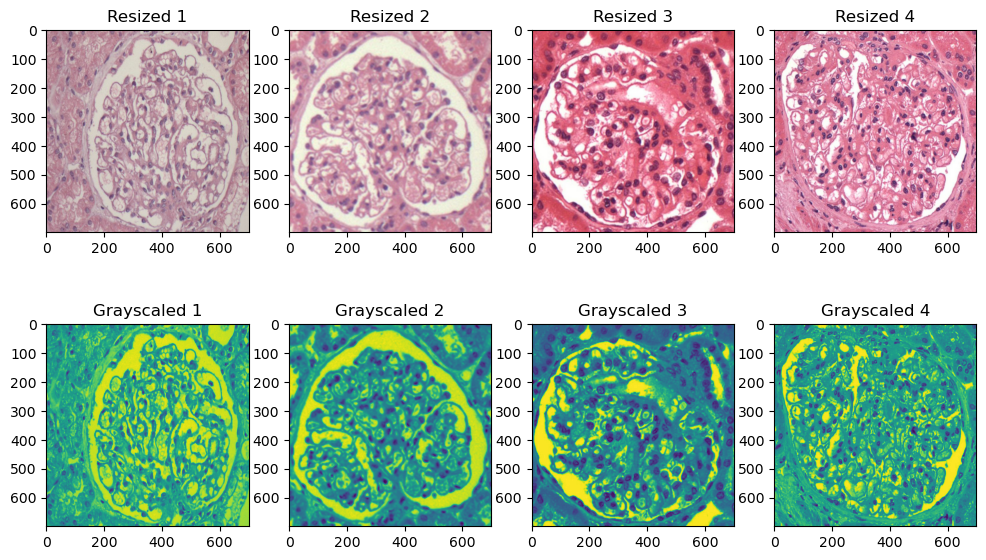

In [7]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='02-grayScaled', 
    )

# Aplicando equalização de histograma em gray scale

In [8]:
def apply_hist_transformation(input_image):
    return equalize_hist(input_image)

transform_and_store(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='03-equalizesHist', 
    transformation_function=apply_hist_transformation
    )

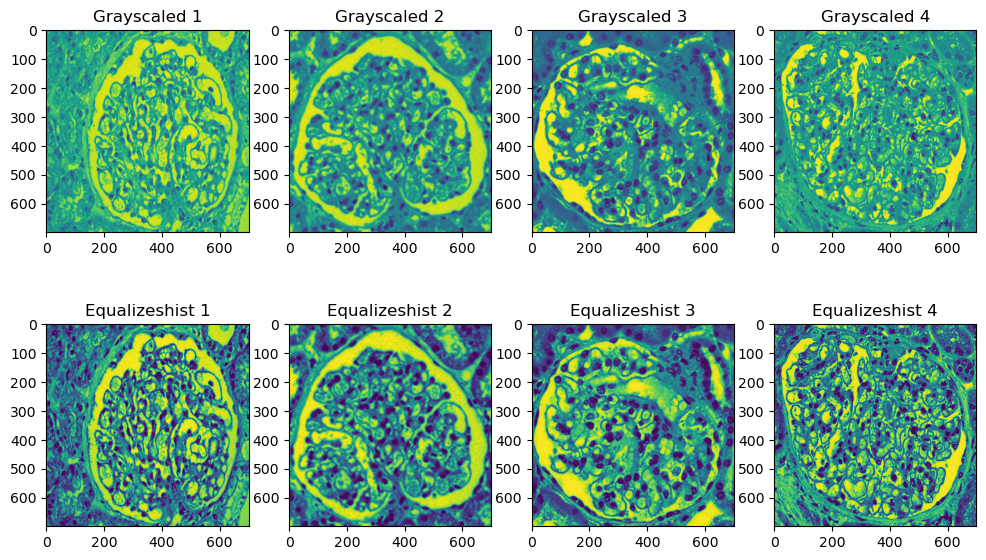

In [9]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='03-equalizesHist', 
    )

# Aplicando correção gamma

### Gamma I (valor=1)

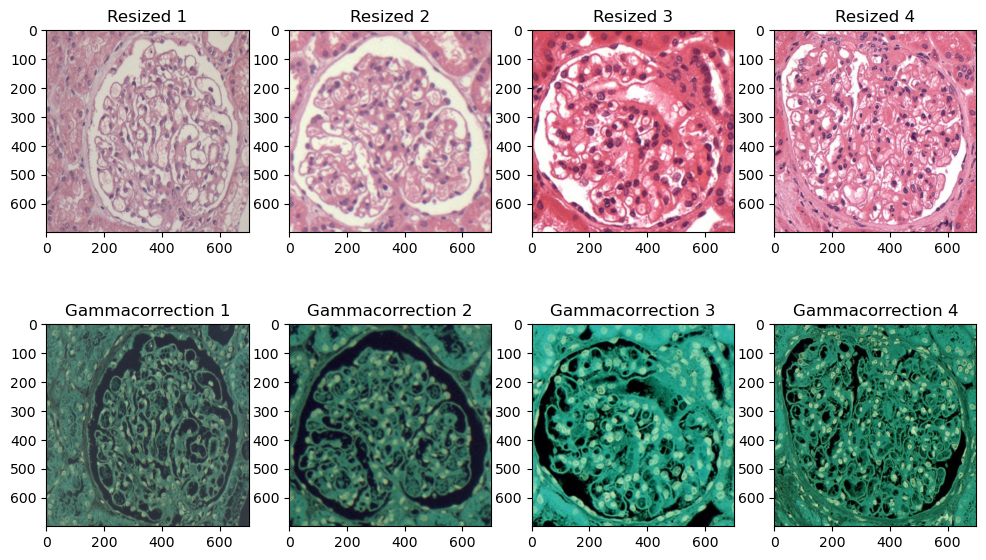

In [11]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=1)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='04-gammaCorrection', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='04-gammaCorrection', 
    )

### Gamma II (valor=2)

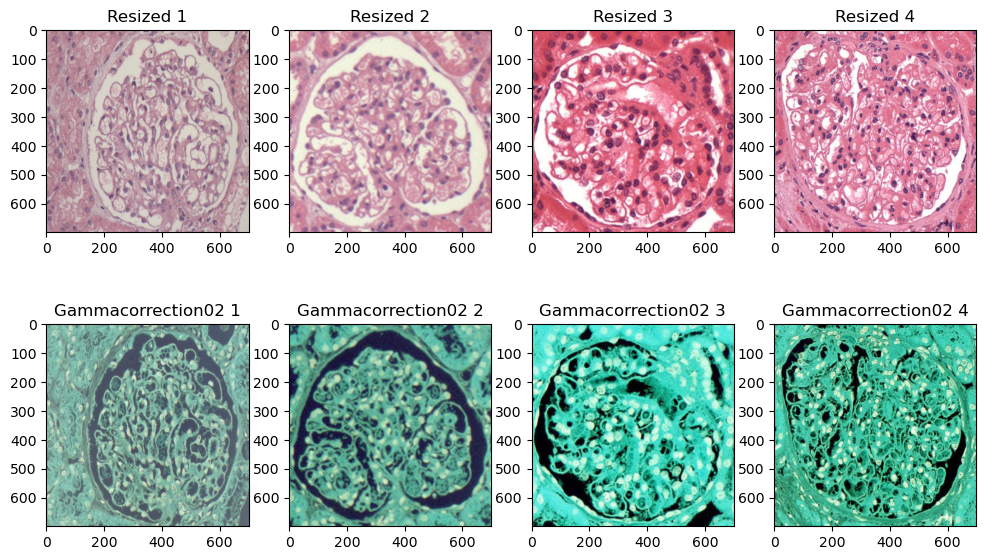

In [12]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=2)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='05-gammaCorrection02', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='05-gammaCorrection02', 
    )

### Gamma III (valor=3)

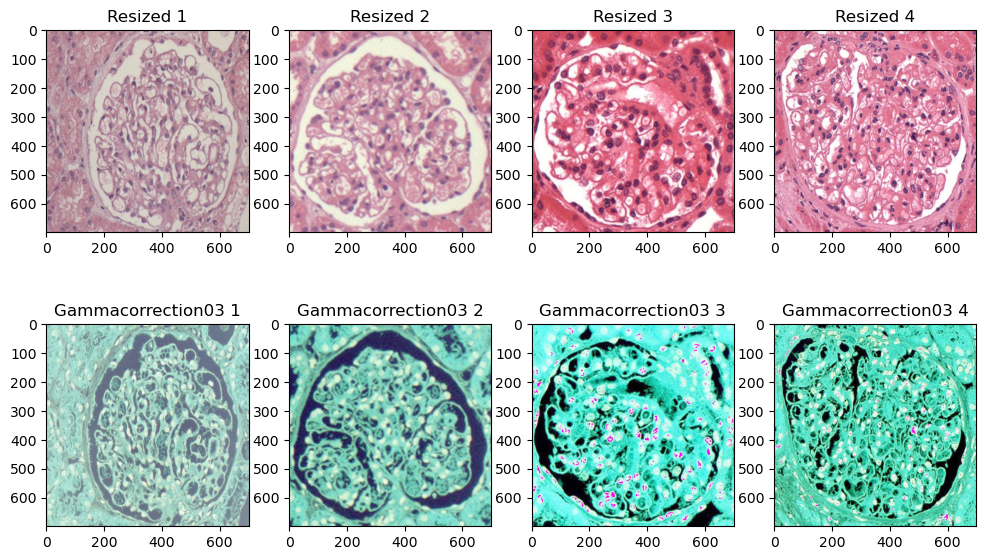

In [13]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=3)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='06-gammaCorrection03', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='06-gammaCorrection03', 
    )

# Aplicando filtro gaussiano

/tmp/ipykernel_7240/214684364.py:2: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return gaussian(input_image, sigma=3, multichannel=True)


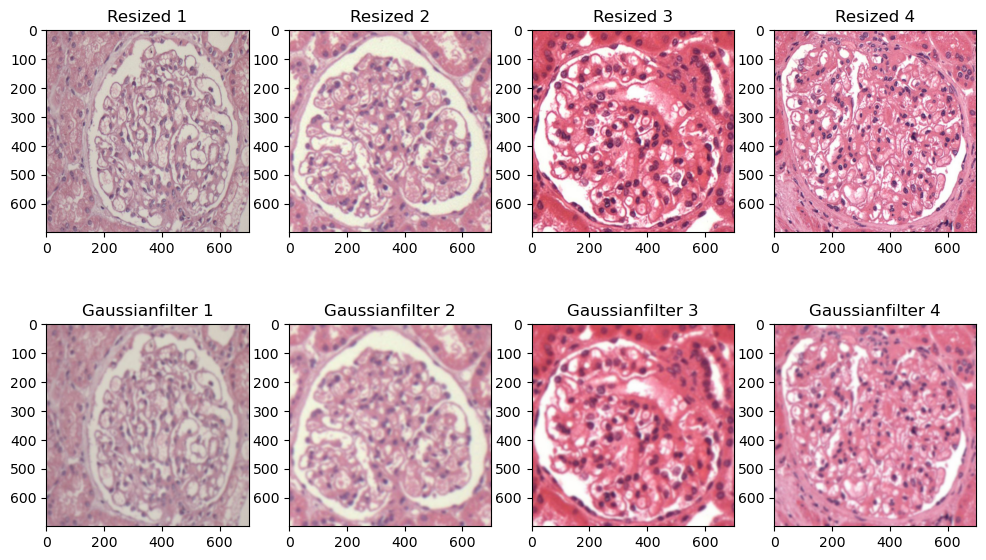

In [18]:

def apply_gaussian_transformation(input_image):
    return gaussian(input_image, sigma=3, multichannel=True)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='07-gaussianFilter', 
    transformation_function=apply_gaussian_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='07-gaussianFilter', 
    )

# Aplicando filtro laplace

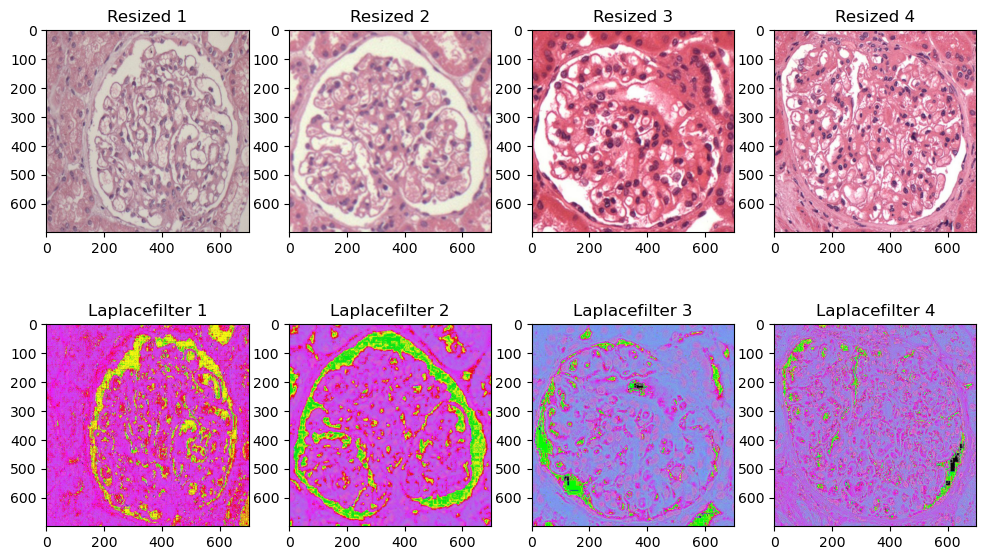

In [40]:

def apply_laplace_transformation(input_image):
    return laplace(input_image.astype(float) , ksize=4)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='08-laplaceFilter', 
    transformation_function=apply_laplace_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='08-laplaceFilter', 
    )

In [44]:
import cv2

In [45]:
path = '../dados/Hypercellularity/00-original/n/113IP71229AAE.jpg'
img = cv2.imread(path,1) # 1 = read image as color
sift = cv2.SIFT_create()
kp = sift.detect(img,None)
img2 = cv2.drawKeypoints(img,kp,None)
cv2.imwrite('siftkpcolor.jpg',img2)

True

In [46]:
img = cv2.imread(path,0) # 0 = read image as gray
sift = cv2.SIFT_create()
kp = sift.detect(img,None)
img2 = cv2.drawKeypoints(img,kp,None)
cv2.imwrite("siftkpgray.jpg",img2)

True

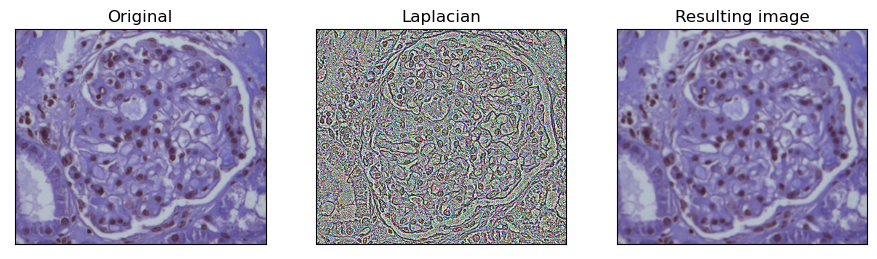

In [50]:
from matplotlib import pyplot as plt

image = cv2.imread(path) # reads the image
image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV) # convert to HSV
image2 = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
new_image = cv2.Laplacian(image2,cv2.CV_64F)

plt.figure(figsize=(11,6))
plt.subplot(131), plt.imshow(image2, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(np.uint8(new_image+255), cmap='gray'),plt.title('Laplacian')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(np.uint8(image2+255) + np.uint8(new_image+255), cmap='gray'),plt.title('Resulting image')
plt.xticks([]), plt.yticks([])
plt.show()

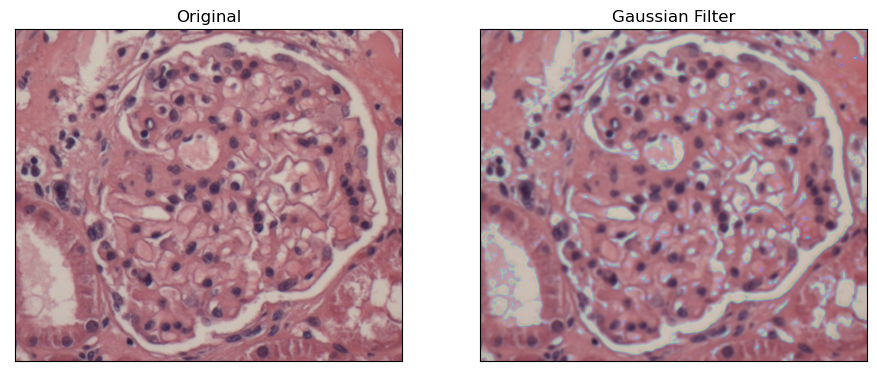

In [52]:
figure_size = 9
new_image = cv2.GaussianBlur(image, (figure_size, figure_size),0)
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_HSV2RGB)),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_HSV2RGB)),plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])
plt.show()

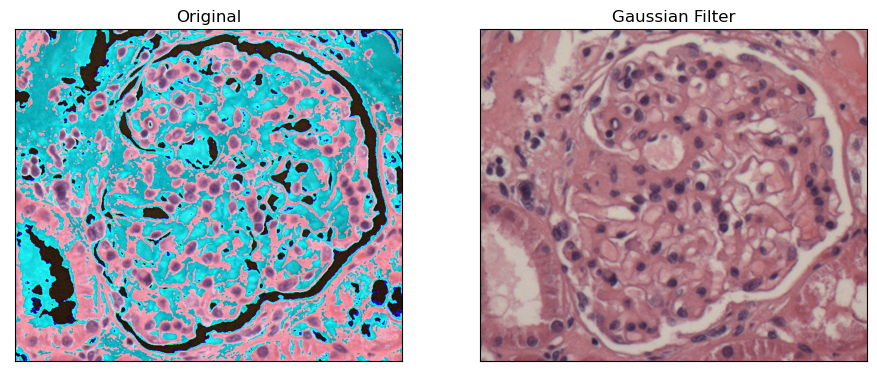

In [61]:
image = cv2.imread(path) # reads the image
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(cv2.cvtColor(np.uint8(image * 1.5) , cv2.COLOR_BGR2RGB)),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])
plt.show()

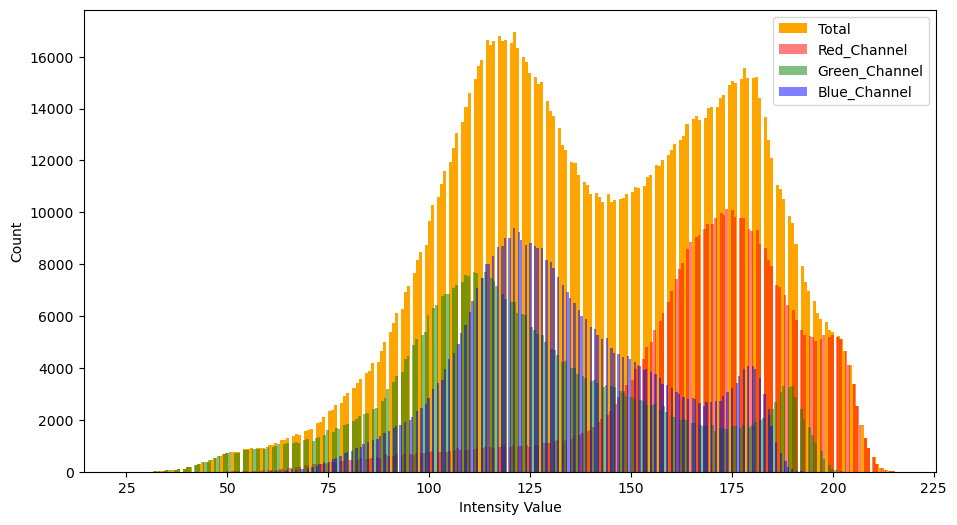

In [63]:
from skimage import io

img = io.imread(path)
plt.figure(figsize=(11,6))
_ = plt.hist(img.ravel(), bins = 256, color = 'orange', )
_ = plt.hist(img[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(img[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(img[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()